In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/emotion-detection-pak-news/pak_channels _news_articles.csv
/kaggle/input/emo-news/emo_dect_news.csv


In [2]:
!pip install transformers

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd


from wordcloud import WordCloud
import torch
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, LSTM, Embedding, Bidirectional,Dropout

import re 
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

from transformers import BertTokenizer, BertConfig,AdamW, BertForSequenceClassification,get_linear_schedule_with_warmup

# **Read CSV Data**

In [4]:
df = pd.read_csv('../input/emotion-detection-pak-news/pak_channels _news_articles.csv', encoding="latin-1")
df.head()

,Date,Author,News_Title,Description
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...


In [5]:
df.isnull().sum()

Date             6
Author           0
News_Title       6
Description    127
dtype: int64

In [6]:
news_df = df.dropna()

In [7]:
news_df.isnull().sum()

Date           0
Author         0
News_Title     0
Description    0
dtype: int64

# **Emotion Detection**
**using EmoRoberta pipline**

In [8]:
from transformers import pipeline

In [9]:
motion = pipeline('sentiment-analysis', model='arpanghoshal/EmoRoBERTa')

2022-07-26 18:58:55.908080: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-26 18:58:55.909151: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-26 18:58:55.909898: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-26 18:58:55.910938: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [10]:
news_df['News_Title'][15:25].apply(motion)

15    [{'label': 'neutral', 'score': 0.8161688446998...
16    [{'label': 'neutral', 'score': 0.9961036443710...
17    [{'label': 'neutral', 'score': 0.9920331835746...
18    [{'label': 'neutral', 'score': 0.9972088932991...
19    [{'label': 'neutral', 'score': 0.7230386734008...
20    [{'label': 'neutral', 'score': 0.9746221303939...
21    [{'label': 'neutral', 'score': 0.9964776635169...
22    [{'label': 'neutral', 'score': 0.9643815159797...
23    [{'label': 'neutral', 'score': 0.9955660700798...
24    [{'label': 'excitement', 'score': 0.7423341274...
Name: News_Title, dtype: object

In [11]:
def get_emotion_label(text):
  return(motion(text)[0]['label'])

In [12]:
get_emotion_label("Karachi matric board demands imposition of Section 144 around examination centres")

'neutral'

In [13]:
news_df['News_Title'][20:50].apply(get_emotion_label)

20        neutral
21        neutral
22        neutral
23        neutral
24     excitement
25        neutral
26        neutral
27        neutral
28        neutral
29        neutral
30        neutral
31        neutral
32        neutral
33        neutral
34        neutral
35        neutral
36        neutral
37        neutral
38        neutral
39        neutral
40        neutral
41        neutral
42        neutral
43    disapproval
44        neutral
45        neutral
46           fear
47        neutral
48       approval
49        neutral
Name: News_Title, dtype: object

In [14]:
news_df['Emotion'] = news_df['News_Title'].apply(get_emotion_label)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Text(0.5, 1.0, 'Emotion Distribution')

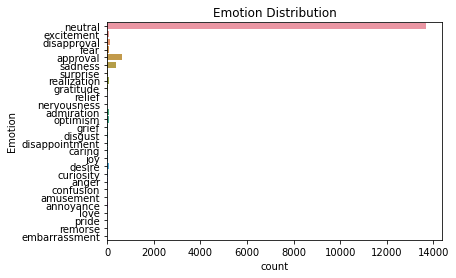

In [15]:
import seaborn as sns
sns.countplot(data = news_df, y = 'Emotion').set_title("Emotion Distribution")

In [16]:
news_df

,Date,Author,News_Title,Description,Emotion
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral
...,...,...,...,...,...
15801,Thursday May 12 2022,Web Desk,Heatwave alert: Sindh declares emergency to de...,KARACHI: Following the Pakistan Meteorological...,neutral
15802,Thursday May 12 2022,SHShahid Hussain,FIA decides not to pursue money laundering cas...,LAHORE: The Federal Investigation Agency (FIA)...,neutral
15803,Thursday May 12 2022,Web Desk,Bilawal Bhutto says PTI minister threatened hi...,ISLAMABAD: Foreign Minister Bilawal Bhutto-Zar...,neutral
15804,Thursday May 12 2022,Awais Yousafzai,IHC bars police from registering further FIRs ...,ISLAMABAD: The Islamabad High Court (IHC) Thur...,neutral



# **Data Wise Analysis**



**Text Cleaning**


In [35]:
news_df["text_clean"] = news_df["News_Title"].apply(lambda x: x.lower())
display(news_df.head())

,Date,Author,News_Title,Description,Emotion,text_clean
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...


In [36]:
# Intall the contractions package - https://github.com/kootenpv/contractions
!pip install contractions

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [37]:
# Tokenizing the  base texts.
from nltk.tokenize import word_tokenize

news_df['tokenized'] = news_df['text_clean'].apply(word_tokenize)
news_df.head()

,Date,Author,News_Title,Description,Emotion,text_clean,tokenized
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe...","[people, demanded, factories, ,, but, govt, es..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...,"[govt, knows, inflation, has, increased, in, c..."
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...,"[ihc, chief, justice, declared, person, of, ye..."
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...,"[ppp, releases, white, paper, on, 'bad, perfor..."
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...,"[prices, of, items, in, use, of, common, man, ..."




**Removing stopwords**


In [38]:
# Removing stopwords.
nltk.download("stopwords")
from nltk.corpus import stopwords

stop = set(stopwords.words('english'))
news_df['stopwords_removed'] = news_df['tokenized'].apply(lambda x: [word for word in x if word not in stop])
news_df.head()

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Date,Author,News_Title,Description,Emotion,text_clean,tokenized,stopwords_removed
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe...","[people, demanded, factories, ,, but, govt, es...","[people, demanded, factories, ,, govt, establi..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...,"[govt, knows, inflation, has, increased, in, c...","[govt, knows, inflation, increased, country, :..."
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...,"[ihc, chief, justice, declared, person, of, ye...","[ihc, chief, justice, declared, person, year, ..."
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...,"[ppp, releases, white, paper, on, 'bad, perfor...","[ppp, releases, white, paper, 'bad, performanc..."
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...,"[prices, of, items, in, use, of, common, man, ...","[prices, items, use, common, man, increased, m..."


**Stemming**


In [39]:
from nltk.stem import PorterStemmer

def porter_stemmer(text):
    """
        Stem words in list of tokenized words with PorterStemmer
    """
    stemmer = nltk.PorterStemmer()
    stems = [stemmer.stem(i) for i in text]
    return stems

In [40]:
%time 

news_df['porter_stemmer'] = news_df['stopwords_removed'].apply(lambda x: porter_stemmer(x))
news_df.head()

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.68 µs


,Date,Author,News_Title,Description,Emotion,text_clean,tokenized,stopwords_removed,porter_stemmer
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe...","[people, demanded, factories, ,, but, govt, es...","[people, demanded, factories, ,, govt, establi...","[peopl, demand, factori, ,, govt, establish, '..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...,"[govt, knows, inflation, has, increased, in, c...","[govt, knows, inflation, increased, country, :...","[govt, know, inflat, increas, countri, :, hamm..."
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...,"[ihc, chief, justice, declared, person, of, ye...","[ihc, chief, justice, declared, person, year, ...","[ihc, chief, justic, declar, person, year, bol..."
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...,"[ppp, releases, white, paper, on, 'bad, perfor...","[ppp, releases, white, paper, 'bad, performanc...","[ppp, releas, white, paper, 'bad, perform, ', ..."
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...,"[prices, of, items, in, use, of, common, man, ...","[prices, items, use, common, man, increased, m...","[price, item, use, common, man, increas, mini-..."


In [41]:
from nltk.stem import SnowballStemmer

def snowball_stemmer(text):
    """
        Stem words in list of tokenized words with SnowballStemmer
    """
    stemmer = nltk.SnowballStemmer("english")
    stems = [stemmer.stem(i) for i in text]
    return stems

In [42]:
%time 

news_df['snowball_stemmer'] = news_df['stopwords_removed'].apply(lambda x: snowball_stemmer(x))
news_df.head()

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


,Date,Author,News_Title,Description,Emotion,text_clean,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe...","[people, demanded, factories, ,, but, govt, es...","[people, demanded, factories, ,, govt, establi...","[peopl, demand, factori, ,, govt, establish, '...","[peopl, demand, factori, ,, govt, establish, l..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...,"[govt, knows, inflation, has, increased, in, c...","[govt, knows, inflation, increased, country, :...","[govt, know, inflat, increas, countri, :, hamm...","[govt, know, inflat, increas, countri, :, hamm..."
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...,"[ihc, chief, justice, declared, person, of, ye...","[ihc, chief, justice, declared, person, year, ...","[ihc, chief, justic, declar, person, year, bol...","[ihc, chief, justic, declar, person, year, bol..."
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...,"[ppp, releases, white, paper, on, 'bad, perfor...","[ppp, releases, white, paper, 'bad, performanc...","[ppp, releas, white, paper, 'bad, perform, ', ...","[ppp, releas, white, paper, bad, perform, ', g..."
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...,"[prices, of, items, in, use, of, common, man, ...","[prices, items, use, common, man, increased, m...","[price, item, use, common, man, increas, mini-...","[price, item, use, common, man, increas, mini-..."


In [43]:
from nltk.stem import LancasterStemmer

def lancaster_stemmer(text):
    """
        Stem words in list of tokenized words with LancasterStemmer
    """
    stemmer = nltk.LancasterStemmer()
    stems = [stemmer.stem(i) for i in text]
    return stems

In [44]:
%time 

news_df['lancaster_stemmer'] = news_df['stopwords_removed'].apply(lambda x: lancaster_stemmer(x))
news_df.head()

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


,Date,Author,News_Title,Description,Emotion,text_clean,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer,lancaster_stemmer
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe...","[people, demanded, factories, ,, but, govt, es...","[people, demanded, factories, ,, govt, establi...","[peopl, demand, factori, ,, govt, establish, '...","[peopl, demand, factori, ,, govt, establish, l...","[peopl, demand, fact, ,, govt, est, 'langarkha..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...,"[govt, knows, inflation, has, increased, in, c...","[govt, knows, inflation, increased, country, :...","[govt, know, inflat, increas, countri, :, hamm...","[govt, know, inflat, increas, countri, :, hamm...","[govt, know, infl, increas, country, :, hammad..."
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...,"[ihc, chief, justice, declared, person, of, ye...","[ihc, chief, justice, declared, person, year, ...","[ihc, chief, justic, declar, person, year, bol...","[ihc, chief, justic, declar, person, year, bol...","[ihc, chief, just, decl, person, year, bold, s..."
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...,"[ppp, releases, white, paper, on, 'bad, perfor...","[ppp, releases, white, paper, 'bad, performanc...","[ppp, releas, white, paper, 'bad, perform, ', ...","[ppp, releas, white, paper, bad, perform, ', g...","[ppp, releas, whit, pap, 'bad, perform, ', gov..."
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...,"[prices, of, items, in, use, of, common, man, ...","[prices, items, use, common, man, increased, m...","[price, item, use, common, man, increas, mini-...","[price, item, use, common, man, increas, mini-...","[pric, item, us, common, man, increas, mini-bu..."




**Lemmatization**


In [48]:
!pip install nltk

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [52]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


True

In [53]:
from nltk.stem import WordNetLemmatizer

def lemmatize_word(text):
    """
        Lemmatize the tokenized words
    """

    lemmatizer = WordNetLemmatizer()
    lemma = [lemmatizer.lemmatize(word, tag) for word, tag in text]
    return lemma

In [54]:
%time 

# Test without POS Tagging
lemmatizer = WordNetLemmatizer()

news_df['lemmatize_word_wo_pos'] = news_df['stopwords_removed'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])
news_df['lemmatize_word_wo_pos'] = news_df['lemmatize_word_wo_pos'].apply(lambda x: [word for word in x if word not in stop])
news_df.head()

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


,Date,Author,News_Title,Description,Emotion,text_clean,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer,lancaster_stemmer,lemmatize_word_wo_pos
0,1-Jan-22,92_news,"People demanded factories, but govt establishe...",ISLAMABAD (92 News) Ã¢ÂÂ Jamaat-e-Islami ame...,neutral,"people demanded factories, but govt establishe...","[people, demanded, factories, ,, but, govt, es...","[people, demanded, factories, ,, govt, establi...","[peopl, demand, factori, ,, govt, establish, '...","[peopl, demand, factori, ,, govt, establish, l...","[peopl, demand, fact, ,, govt, est, 'langarkha...","[people, demanded, factory, ,, govt, establish..."
1,1-Jan-22,92_news,Govt knows inflation has increased in country:...,LAHORE (92 News) Ã¢ÂÂ Federal Minister for E...,neutral,govt knows inflation has increased in country:...,"[govt, knows, inflation, has, increased, in, c...","[govt, knows, inflation, increased, country, :...","[govt, know, inflat, increas, countri, :, hamm...","[govt, know, inflat, increas, countri, :, hamm...","[govt, know, infl, increas, country, :, hammad...","[govt, know, inflation, increased, country, :,..."
2,1-Jan-22,92_news,IHC chief justice declared Person of Year for ...,ISLAMABAD (92 News) Ã¢ÂÂ The Center for Gove...,neutral,ihc chief justice declared person of year for ...,"[ihc, chief, justice, declared, person, of, ye...","[ihc, chief, justice, declared, person, year, ...","[ihc, chief, justic, declar, person, year, bol...","[ihc, chief, justic, declar, person, year, bol...","[ihc, chief, just, decl, person, year, bold, s...","[ihc, chief, justice, declared, person, year, ..."
3,1-Jan-22,92_news,PPP releases white paper on 'bad performance' ...,KARACHI (92 News) Ã¢ÂÂ The Pakistan People's...,neutral,ppp releases white paper on 'bad performance' ...,"[ppp, releases, white, paper, on, 'bad, perfor...","[ppp, releases, white, paper, 'bad, performanc...","[ppp, releas, white, paper, 'bad, perform, ', ...","[ppp, releas, white, paper, bad, perform, ', g...","[ppp, releas, whit, pap, 'bad, perform, ', gov...","[ppp, release, white, paper, 'bad, performance..."
4,1-Jan-22,92_news,Prices of items in use of common man not incre...,KARACHI (92 News) Ã¢ÂÂ Finance Ministry Spok...,neutral,prices of items in use of common man not incre...,"[prices, of, items, in, use, of, common, man, ...","[prices, items, use, common, man, increased, m...","[price, item, use, common, man, increas, mini-...","[price, item, use, common, man, increas, mini-...","[pric, item, us, common, man, increas, mini-bu...","[price, item, use, common, man, increased, min..."


In [59]:
print(news_df["News_Title"][8])
print(news_df["lemmatize_word_wo_pos"][8])


Omicron spread: Micro-smart lockdown enforced in Karachi's Gulshan Iqbal area till Jan 14
['omicron', 'spread', ':', 'micro-smart', 'lockdown', 'enforced', 'karachi', "'s", 'gulshan', 'iqbal', 'area', 'till', 'jan', '14']



# **Data Visualization**

In [62]:
def words_cloud(wordcloud, df):
    plt.figure(figsize=(10, 10))
    plt.title(df+' Word Cloud', size = 16)
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

In [63]:
emotions_list = news_df['Emotion'].unique()
emotions_list

array(['neutral', 'excitement', 'disapproval', 'fear', 'approval',
       'sadness', 'surprise', 'realization', 'gratitude', 'relief',
       'nervousness', 'admiration', 'optimism', 'grief', 'disgust',
       'disappointment', 'caring', 'joy', 'desire', 'curiosity', 'anger',
       'confusion', 'amusement', 'annoyance', 'love', 'pride', 'remorse',
       'embarrassment'], dtype=object)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



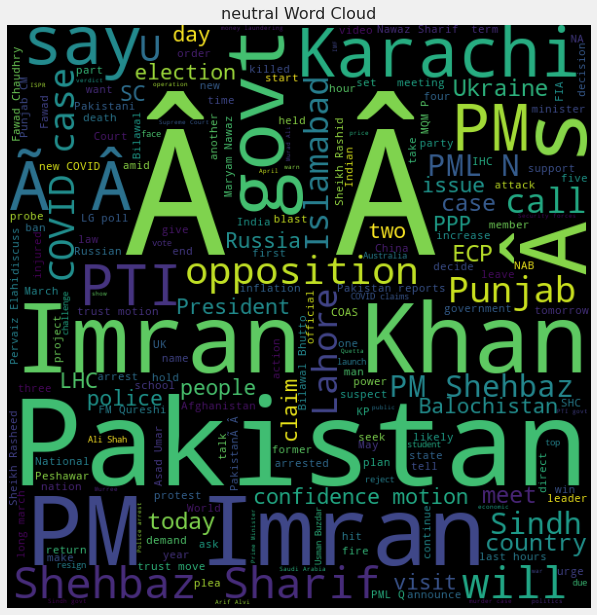

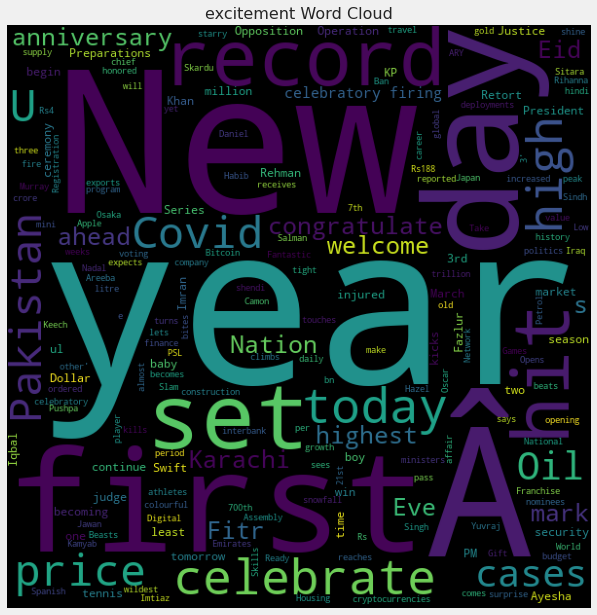

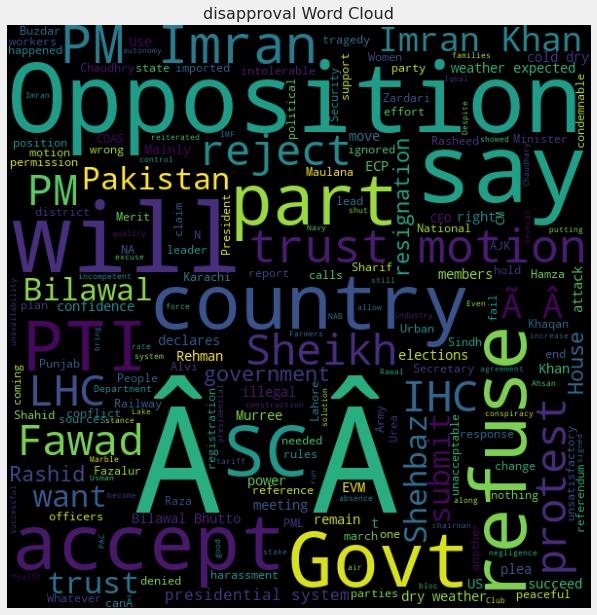

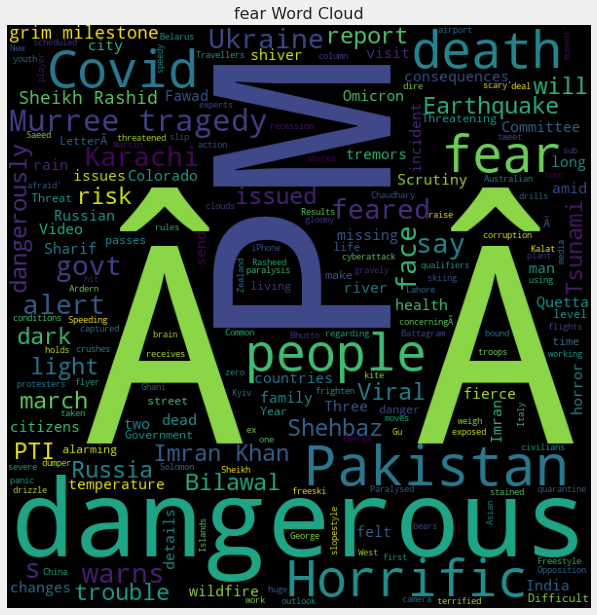

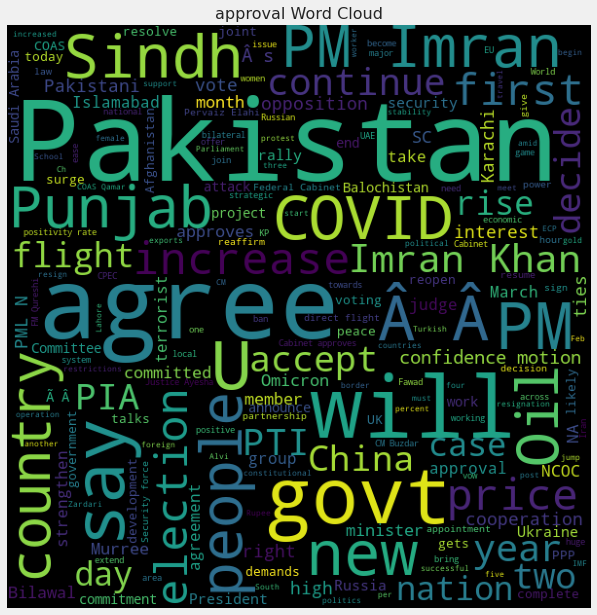

...

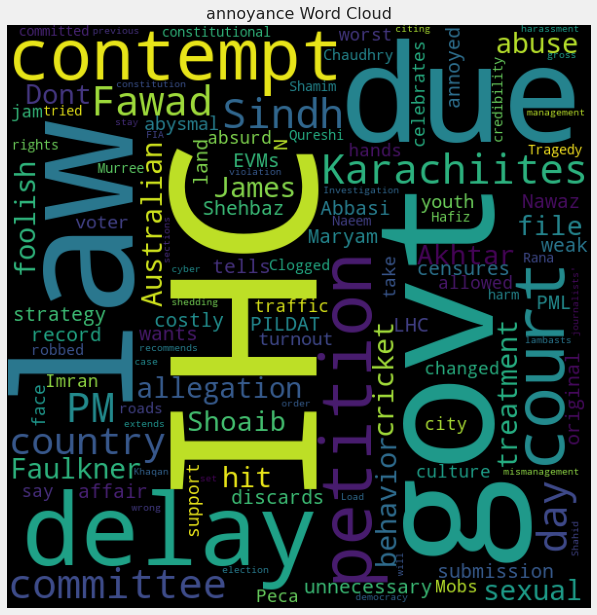

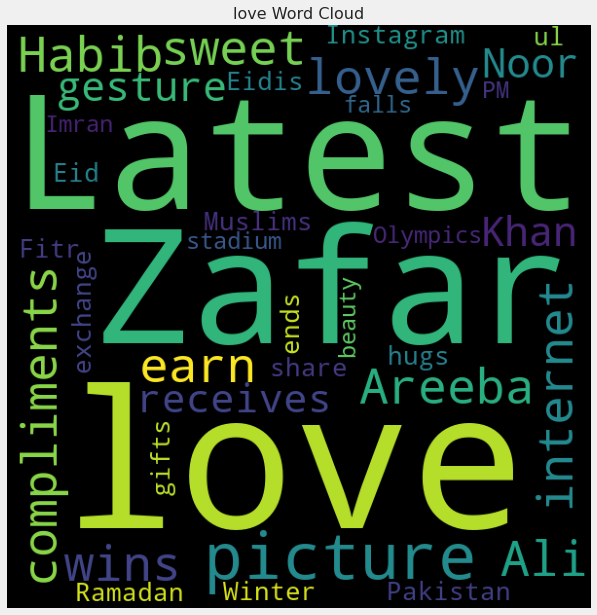

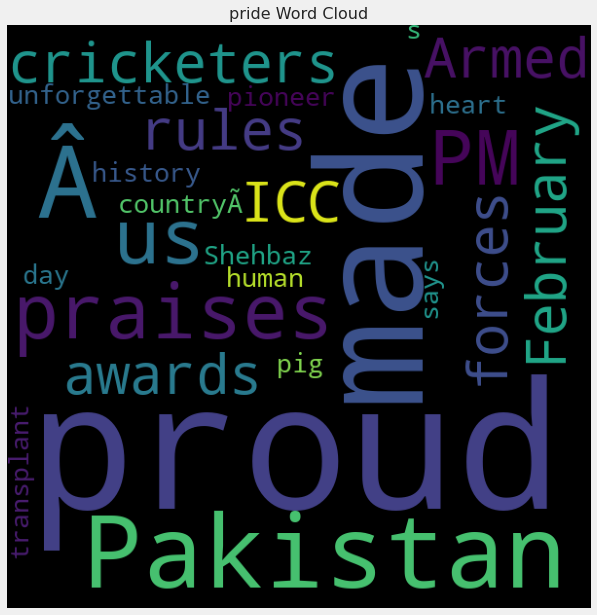

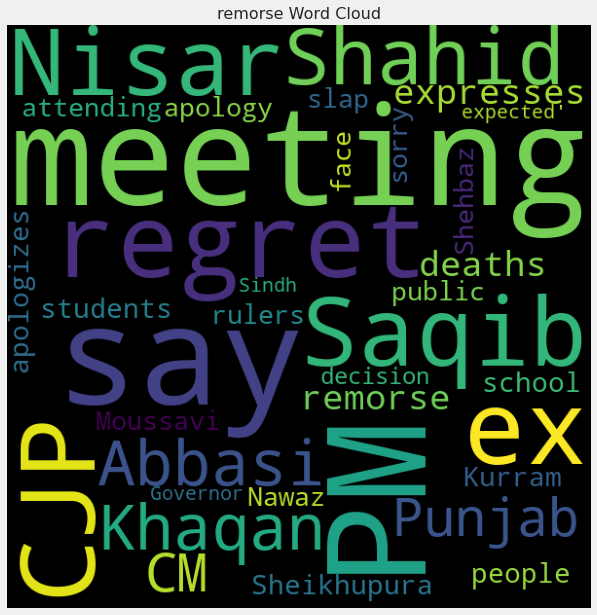

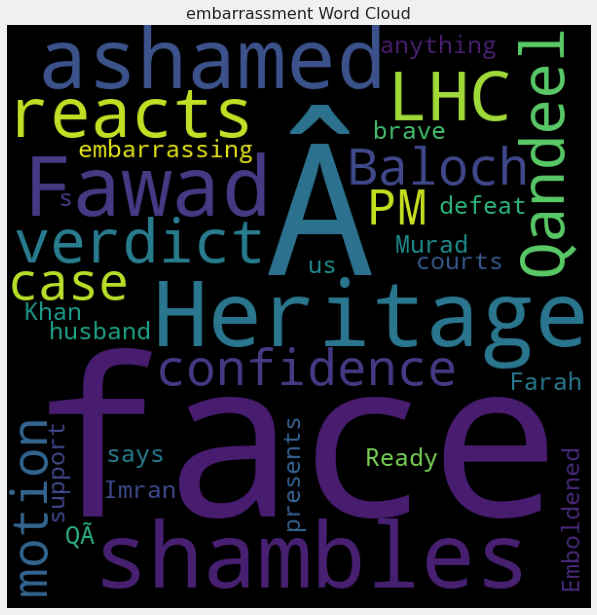

In [64]:
for emotion in emotions_list:
    text = ' '.join([sentence for sentence in news_df.loc[news_df['Emotion'] == emotion,'News_Title']])
    wordcloud = WordCloud(width = 600, height = 600).generate(text)
    words_cloud(wordcloud, emotion)

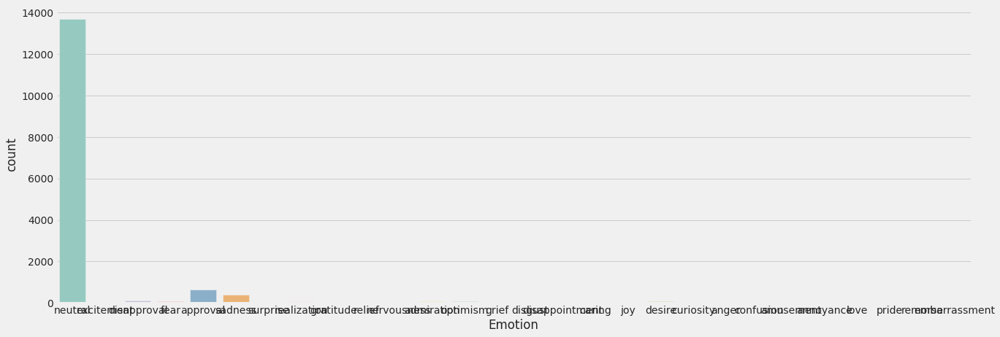

In [65]:
plt.figure(figsize = (20,7))
#sns.set_theme(style="darkgrid")

ax = sns.countplot(x="Emotion", data=news_df, palette="Set3", dodge=False)

In [66]:
from collections import Counter
news_df['temp_list'] = news_df['Emotion'].apply(lambda x:str(x).split())
top = Counter([item for sublist in news_df['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
#temp.style.background_gradient(cmap='Blues')

In [67]:
import plotly.express as px
fig = px.bar(temp, x="count", y="Common_words", title='Emotions Detection', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()

In [68]:
# Tree of the most common words
fig = px.treemap(temp, path=['Common_words'], values='count',title='Tree Of Emotions')
fig.show()

In [74]:
import string # String module contains some constants, utility function, and classes for string manipulation
import re

# For viz
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from collections import Counter

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
pd.options.mode.chained_assignment = None

In [90]:
import collections
import tqdm
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import gc
import transformers
from transformers import AutoTokenizer , AutoModel ,AutoModelForSequenceClassification , RobertaTokenizer ,RobertaModel ,BertTokenizer
from transformers import RobertaForSequenceClassification , AdamW  ,get_linear_schedule_with_warmup , RobertaTokenizerFast
from transformers import TFAutoModelForSequenceClassification , TFAutoModel
from transformers import DistilBertForSequenceClassification , TFDistilBertForSequenceClassification , TFAutoModel
from sklearn.feature_extraction.text import CountVectorizer
import spacy
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.preprocessing import OneHotEncoder
import torch
import torch.nn as nn
from torch.utils.data import DataLoader ,Dataset
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , classification_report ,f1_score , accuracy_score ,precision_score ,recall_score
import os
import re 
import nltk
import gc
import warnings
warnings.filterwarnings('ignore')

from tensorflow import keras
from keras.layers import Dense ,Dropout , Input
from keras.models import Sequential , Model
from transformers import TFRobertaModel
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression ,Ridge ,Lasso
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier ,GradientBoostingClassifier ,ExtraTreesClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC ,LinearSVC
from sklearn.naive_bayes import MultinomialNB , GaussianNB
from sklearn.feature_extraction.text import TfidfVectorizer

In [76]:
var1 = news_df.groupby('Emotion').count()['News_Title'].reset_index().sort_values(by='News_Title',ascending=False)
sns.set_style("white")
sns.set_palette("Set2")
var1.style.background_gradient()

,Emotion,News_Title
20,neutral,13680
4,approval,631
26,sadness,391
10,disapproval,111
0,admiration,88
14,fear,84
8,desire,72
21,optimism,69
23,realization,67
13,excitement,62


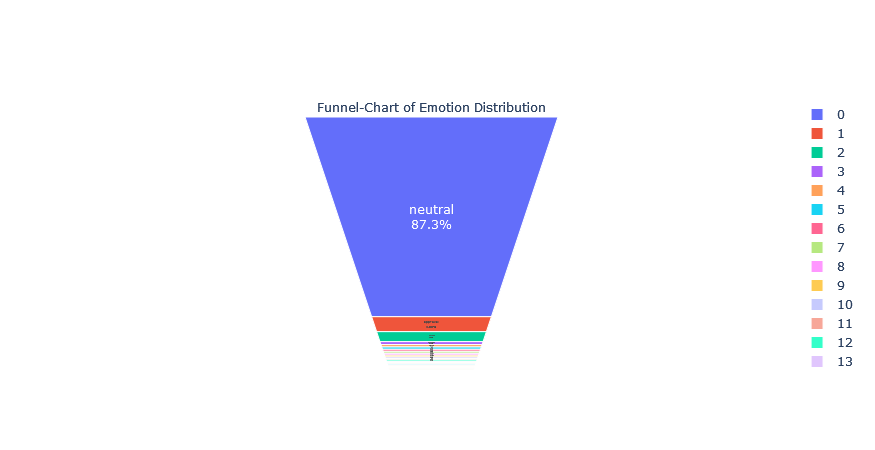

In [78]:
fig = go.Figure(go.Funnelarea(
    text =var1.Emotion,
    values = var1.News_Title,
    title = {"position": "top center", "text": "Funnel-Chart of Emotion Distribution"}
    ))
fig.show()

<AxesSubplot:ylabel='Density'>

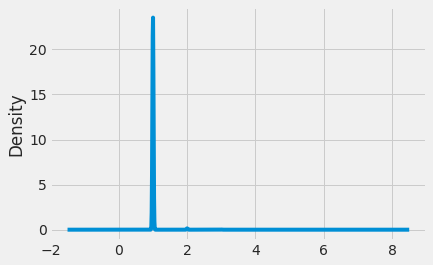

In [69]:
news_df.News_Title.value_counts().plot(kind='kde')

<AxesSubplot:>

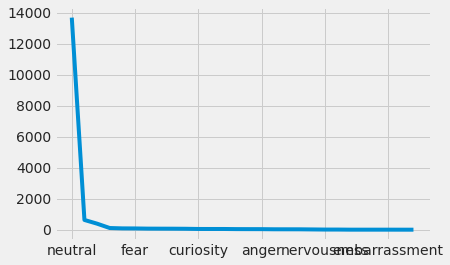

In [70]:
news_df.Emotion.value_counts().plot(kind='line')

In [91]:
news_df['Emotion'].value_counts()

neutral           13680
approval            631
sadness             391
disapproval         111
admiration           88
fear                 84
desire               72
optimism             69
realization          67
excitement           62
curiosity            50
caring               49
gratitude            49
disappointment       41
joy                  39
anger                38
surprise             30
grief                29
disgust              28
annoyance            20
nervousness          12
confusion            12
amusement             5
love                  5
remorse               5
embarrassment         5
relief                4
pride                 3
Name: Emotion, dtype: int64

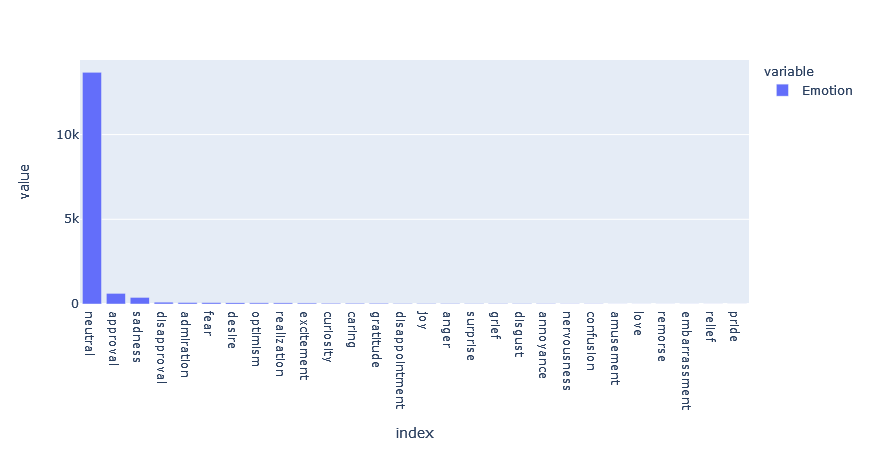

In [94]:
px.bar(news_df['Emotion'].value_counts())

In [95]:
df.News_Title.head(2).values

array(["People demanded factories, but govt established 'langarkhanas': Sirajul Haq",
       'Govt knows inflation has increased in country: Hammad Azhar'],
      dtype=object)

In [96]:
# most common words in data set
print(collections.Counter(' '.join(df.News_Title).split()).most_common(20))

[('to', 5107), ('in', 4580), ('of', 3564), ('for', 2050), ('on', 1743), ('PM', 1722), ('Imran', 1351), ('Pakistan', 1123), ('Khan', 916), ('as', 846), ('against', 780), ('with', 768), ('says', 730), ('from', 686), ('Shehbaz', 621), ('Karachi', 592), ('Punjab', 583), ('PTI', 579), ('over', 552), ('at', 525)]


In [98]:
def clean_text(text):
    url_regex ='((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*'

    text = text.lower()
#     text = re.sub('@(\w)+',' username ',text)
#     text = re.sub('#(\w)+',' hastag ',text)
#     text = re.sub(url_regex,' url ',text)
    text = re.sub(url_regex,' ',text)

    text = re.sub('@(\w)+','  ',text)
    text = re.sub('#(\w)+','  ',text)
    text = re.sub('(\r)+',' ',text)
    text = re.sub('(\n)+',' ',text)
    
    text = re.sub('(\?)+',' ',text)
    text = re.sub('(\.)+',' ',text)
    symbol = [
        'â\x97','â\x85','â\x92','â\x92','â\x92t','Â\x93','Â\x85',
        'Â\x96','Â\x92','Â\x94','â\x93','â\x91','â\x94','â\x96','â','â·','\x80'
            ]
    for i in symbol:
        text = re.sub(i,' ',text)
    html =[
        '&amp;'
          ]
    for i in html:
        text = re.sub(i,' & ',text)
    text = re.sub('\'','',text) 
    text = re.sub('https*',' ',text) 

    
    text = re.sub('!+','  ',text)    
    
    text = re.sub(':\(',' sad ',text)
    text = re.sub('/+',' ',text)
    text = re.sub('\|+',' ',text)
    
    # Word Tokenizer
    tokenizer = nltk.tokenize.word_tokenize
    
    # Drop Stop Words
    english_stop_words = nltk.corpus.stopwords.words('english')
    text = " ".join([word for word in tokenizer(text) if word not in english_stop_words ])
    
    text = re.sub('\s+',' ',text)
    return text 

In [105]:
df['clean_text'] = df['News_Title'].apply(clean_text)
df['length']     = df.clean_text.apply(lambda x:len(x.split()))

print(df.clean_text.apply(lambda x:len(x.split())).min())
print(df.clean_text.apply(lambda x:len(x.split())).max())


1
25


In [107]:
def get_n_grams(text,low_n,high_n,top_number):
    '''
    Function to Make a tuple of words and the count of each word repeated 
    in the List
    
    input ->  list of text or pandas series, n_gram_range (low ,high) , 
              number of top word 
    
    '''
    # create vocabulary
    vec = CountVectorizer(ngram_range=(low_n,high_n)).fit(text)
    B_O_G = vec.transform(text)
    
    # Get words Count
    words_count = B_O_G.sum(axis=0)
    
    # create list of words counts
    word_counts_list = np.array(words_count)[0].tolist()
    
    # create tuple of word and words count
    data = [ (word ,word_counts_list[idx]) for word,idx in vec.vocabulary_.items() ]
    
    # sort words by count descending
    sorted_data = sorted(data,key=lambda x:x[1] ,reverse=True)
    sorted_data = sorted_data[:top_number]
    new_s = []
    for d , n in sorted_data:
        new_s.append([d ,n])
    
    del vec , data ,B_O_G ,words_count,word_counts_list ,sorted_data
    plt.figure(figsize=(10,5))
    sns.barplot(data = pd.DataFrame(new_s,columns=['word','count']),x='word',y='count')
    plt.xticks(rotation=90)
    plt.show()
    
    return pd.DataFrame(new_s,columns=['word','count'])

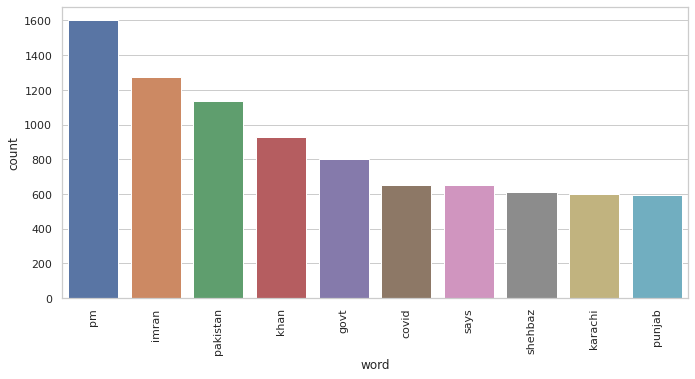

,word,count
0,pm,1600
1,imran,1275
2,pakistan,1136
3,khan,927
4,govt,801
5,covid,651
6,says,651
7,shehbaz,614
8,karachi,602
9,punjab,597


In [108]:
query_df = df[(df.Emotion== 'neutral')]
get_n_grams(query_df.clean_text,1,1,10)

In [109]:
encoder ={'neutral':0, 'excitement':1, 'disapproval':2, 'fear':3, 'approval':4,
       'sadness':5, 'surprise':6, 'realization':7, 'gratitude':8, 'relief':9,
       'nervousness':10, 'admiration':11, 'optimism':12, 'grief':13, 'disgust':14,
       'disappointment':15, 'caring':16, 'joy':17, 'desire':18, 'curiosity':19, 'anger':20,
       'confusion':21, 'amusement':22, 'annoyance':23, 'love':24, 'pride':25, 'remorse':26,
       'embarrassment':27}

df.Emotion = df.Emotion.map(encoder)

In [110]:
print('min sentences length : ',df.length.min())
print('max sentences length : ',df.length.max())

min sentences length :  1
max sentences length :  25


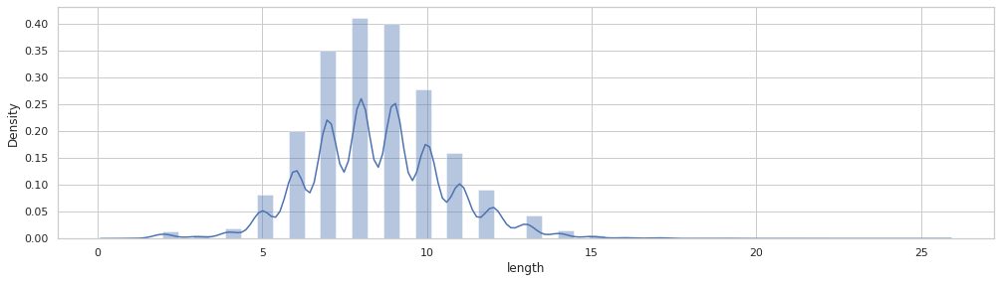

In [111]:
plt.figure(figsize=(15,4))
sns.distplot(df['length'])
plt.show()

# **Construct Emotion Table with %**

# Count Table

count emotion w.r.t author

In [71]:
# Plotly imports
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

In [72]:
hpl = news_df[news_df.Emotion=="sadness"]["Author"].values

(-0.5, 399.5, 199.5, -0.5)

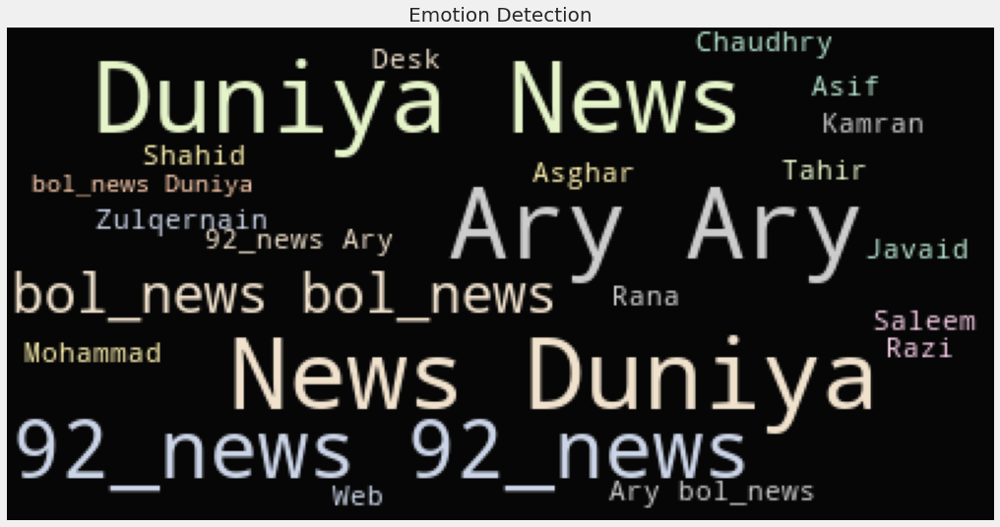

In [73]:
# The wordcloud of Cthulhu/squidy thing for HP Lovecraft
plt.figure(figsize=(16,13))
wc = WordCloud(background_color="black", max_words=10000, stopwords=STOPWORDS, max_font_size= 40)
wc.generate(" ".join(hpl))
plt.title("Emotion Detection", fontsize=20)
# plt.imshow(wc.recolor( colormap= 'Pastel1_r' , random_state=17), alpha=0.98)
plt.imshow(wc.recolor( colormap= 'Pastel2' , random_state=17), alpha=0.98)
plt.axis('off')

<AxesSubplot:xlabel='Author', ylabel='count'>

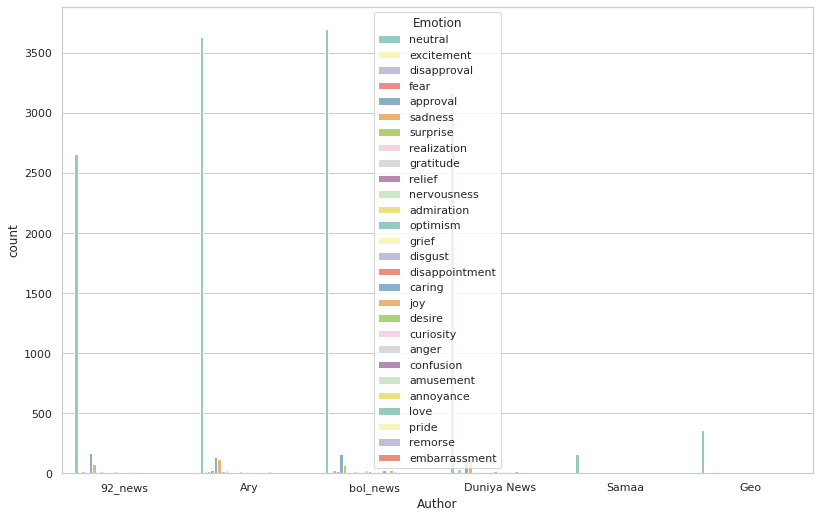

In [83]:
plt.figure(figsize=(12,8))
sns.set_theme(style='whitegrid')
sns.countplot(x=df.Author, hue=df.Emotion, palette='Set3')

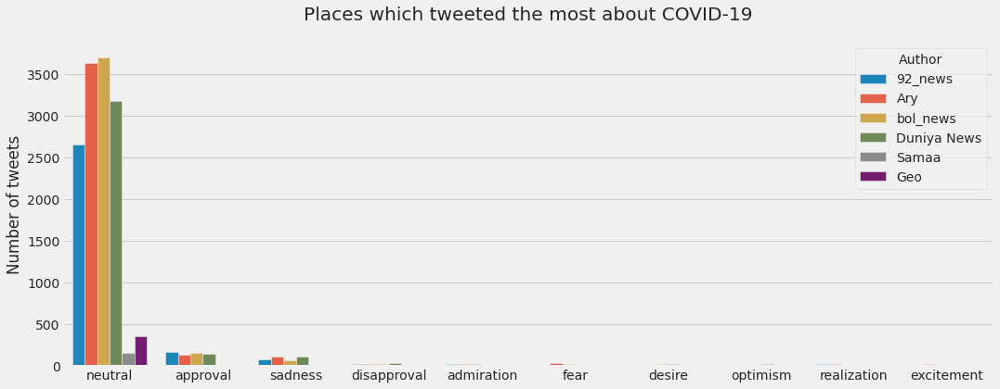

In [79]:
df = pd.read_csv('../input/emo-news1/emo_dect_news.csv')
# plot of top cities/countries
plt.style.use("fivethirtyeight")

plt.figure(figsize=(16, 6))
location = sns.countplot(x= 'Emotion', data= df, hue="Author", order=news_df.Emotion.value_counts()[:10].index)
location.set_title("Places which tweeted the most about COVID-19", y=1.05)

def axis_labels(ax):
    ax.set_ylabel("Number of tweets")
    ax.set_xlabel("")

axis_labels(location)

plt.show()


In [85]:
df_solution = df.pivot_table(index=['Author','Emotion'], aggfunc='size')
df_solution

Author    Emotion    
92_news   admiration      24
          amusement        1
          anger            6
          approval       167
          caring           7
                        ... 
bol_news  realization      8
          relief           2
          remorse          2
          sadness         72
          surprise         4
Length: 130, dtype: int64

In [89]:
pd.crosstab(index=[df['Emotion']], 
            columns=df['Author'], 
            margins=True, margins_name='Total_Attempts')

Author,92_news,Ary,Duniya News,Geo,Samaa,bol_news,Total_Attempts
Emotion,,,,,,,
admiration,24,22,14,1,0,27,88
amusement,1,4,0,0,0,0,5
anger,6,8,11,0,0,13,38
annoyance,0,3,5,2,0,10,20
approval,167,134,151,10,7,162,631
caring,7,7,9,0,0,26,49
confusion,1,5,4,1,0,1,12
curiosity,4,19,7,3,1,16,50
desire,11,9,23,1,1,27,72


In [87]:
(df.groupby('Emotion')['Author']
   .value_counts(normalize=True).mul(100).round(2)
   .sort_index()
   .to_frame(name='Result_%')
).reset_index()

,Emotion,Author,Result_%
0,admiration,92_news,27.27
1,admiration,Ary,25.00
2,admiration,Duniya News,15.91
3,admiration,Geo,1.14
4,admiration,bol_news,30.68
...,...,...,...
125,surprise,Ary,53.33
126,surprise,Duniya News,3.33
127,surprise,Geo,3.33
128,surprise,Samaa,3.33


# **Model Build**

In [114]:
from keras.utils.np_utils import to_categorical
from sklearn.preprocessing import LabelEncoder


def get_label_encoder_obj(y):
    label_encoder = LabelEncoder()
    return label_encoder.fit(y)


def get_y_label_encoder(label_encoder, y):
    return label_encoder.transform(y)


def get_label_decoder(label_encoder, y):
    return label_encoder.classes_[y]


def one_hot_encode(y, num_classes):
    return to_categorical(y, num_classes=num_classes)

In [115]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(news_df, test_size=0.1, random_state=2, stratify=news_df["Emotion"])

In [116]:
label_encoder = get_label_encoder_obj(train["Emotion"])
train["Emotion"] = get_y_label_encoder(label_encoder, train["Emotion"])
val["Emotion"] = get_y_label_encoder(label_encoder, val["Emotion"])

In [117]:
num_classes = len(np.unique(train["Emotion"]))
num_classes

28

In [118]:
X_train = train["News_Title"].values
y_train = train["Emotion"].values
X_val = val["News_Title"].values
y_val = val["Emotion"].values

In [119]:
from sklearn.feature_extraction.text import CountVectorizer

def CountVectorizer_fit(X_train, ngram_range=(1,1)):
    count_vect = CountVectorizer(ngram_range=ngram_range)
    return count_vect.fit(X_train)


def CountVectorizer_transform(count_vect, X):
    return count_vect.transform(X)

In [120]:
from matplotlib import pyplot as plt
from sklearn.metrics import roc_curve, auc
from itertools import cycle


def ROC_plot(y_true_ohe, y_hat_ohe, label_encoder, n_classes):    
    lw = 2
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_ohe[:, i], y_hat_ohe[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
                                  
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_ohe.ravel(), y_hat_ohe.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    plt.figure(figsize=(20,20))
    plt.plot(
        fpr["micro"],
        tpr["micro"],
        label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
        color="deeppink",
        linestyle=":",
        linewidth=4,
    )

    plt.plot(
        fpr["macro"],
        tpr["macro"],
        label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
        color="navy",
        linestyle=":",
        linewidth=4,
    )

    colors = cycle(["aqua", "darkorange", "cornflowerblue"])
    for i, color in zip(range(n_classes), colors):
        plt.plot(
            fpr[i],
            tpr[i],
            color=color,
            lw=lw,
            label="ROC curve of class {0} (area = {1:0.2f})".format(label_encoder.classes_[i], roc_auc[i]))

    plt.plot([0, 1], [0, 1], "k--", lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("multiclass characteristic")
    plt.legend(loc="lower right")
    plt.show()

In [121]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support,confusion_matrix, classification_report, precision_score, recall_score
from sklearn.metrics import f1_score as f1_score_rep
import seaborn as sn


def print_score(y_pred, y_real, label_encoder):
    print("Accuracy: ", accuracy_score(y_real, y_pred))
    print("Precision:: ", precision_score(y_real, y_pred, average="micro"))
    print("Recall:: ", recall_score(y_real, y_pred, average="micro"))
    print("F1_Score:: ", f1_score_rep(y_real, y_pred, average="micro"))

    print()
    print("Macro precision_recall_fscore_support (macro) average")
    print(precision_recall_fscore_support(y_real, y_pred, average="macro"))

    print()
    print("Macro precision_recall_fscore_support (micro) average")
    print(precision_recall_fscore_support(y_real, y_pred, average="micro"))

    print()
    print("Macro precision_recall_fscore_support (weighted) average")
    print(precision_recall_fscore_support(y_real, y_pred, average="weighted"))
    
    print()
    print("Confusion Matrix")
    cm = confusion_matrix(y_real, y_pred)
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cm = pd.DataFrame(cm, index = [i for i in label_encoder.classes_],
                  columns = [i for i in label_encoder.classes_])
    plt.figure(figsize = (20,20))
    sn.heatmap(df_cm, annot=True)

    print()
    print("Classification Report")
    print(classification_report(y_real, y_pred, target_names=label_encoder.classes_))

In [122]:
count_vect = CountVectorizer_fit(X_train, ngram_range=(1,3))
X_train_counts = CountVectorizer_transform(count_vect, X_train)
X_val_counts = CountVectorizer_transform(count_vect, X_val)

In [123]:
from sklearn.feature_extraction.text import TfidfTransformer


def TfidfTransformer_fit(X_train_counts, use_idf=True):
    tf_transformer = TfidfTransformer(use_idf=use_idf)
    return tf_transformer.fit(X_train_counts)


def TfidfTransformer_transform(tf_transformer, X_counts):
    return tf_transformer.transform(X_counts)

In [124]:
tf_transformer = TfidfTransformer_fit(X_train_counts)
X_train_tfidf = TfidfTransformer_transform(tf_transformer, X_train_counts)
X_val_tfidf = TfidfTransformer_transform(tf_transformer, X_val_counts)

In [125]:
from sklearn.model_selection import GridSearchCV

In [126]:
from sklearn.linear_model import SGDClassifier

%time
grid_params = { "loss": ["hinge", "log", "modified_huber"],
               "penalty": ["l1", "l2", "elasticnet"],
               "alpha": [1e-5],
               "max_iter":[15]
    
}

grid = GridSearchCV(SGDClassifier(), grid_params, refit=True, cv=3, verbose=1)
grid.fit(X_train_tfidf, y_train)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.39 µs
Fitting 3 folds for each of 9 candidates, totalling 27 fits


GridSearchCV(cv=3, estimator=SGDClassifier(),
             param_grid={'alpha': [1e-05],
                         'loss': ['hinge', 'log', 'modified_huber'],
                         'max_iter': [15],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             verbose=1)

In [127]:


print(grid.best_params_)
print(grid.best_estimator_)



{'alpha': 1e-05, 'loss': 'hinge', 'max_iter': 15, 'penalty': 'l1'}
SGDClassifier(alpha=1e-05, max_iter=15, penalty='l1')


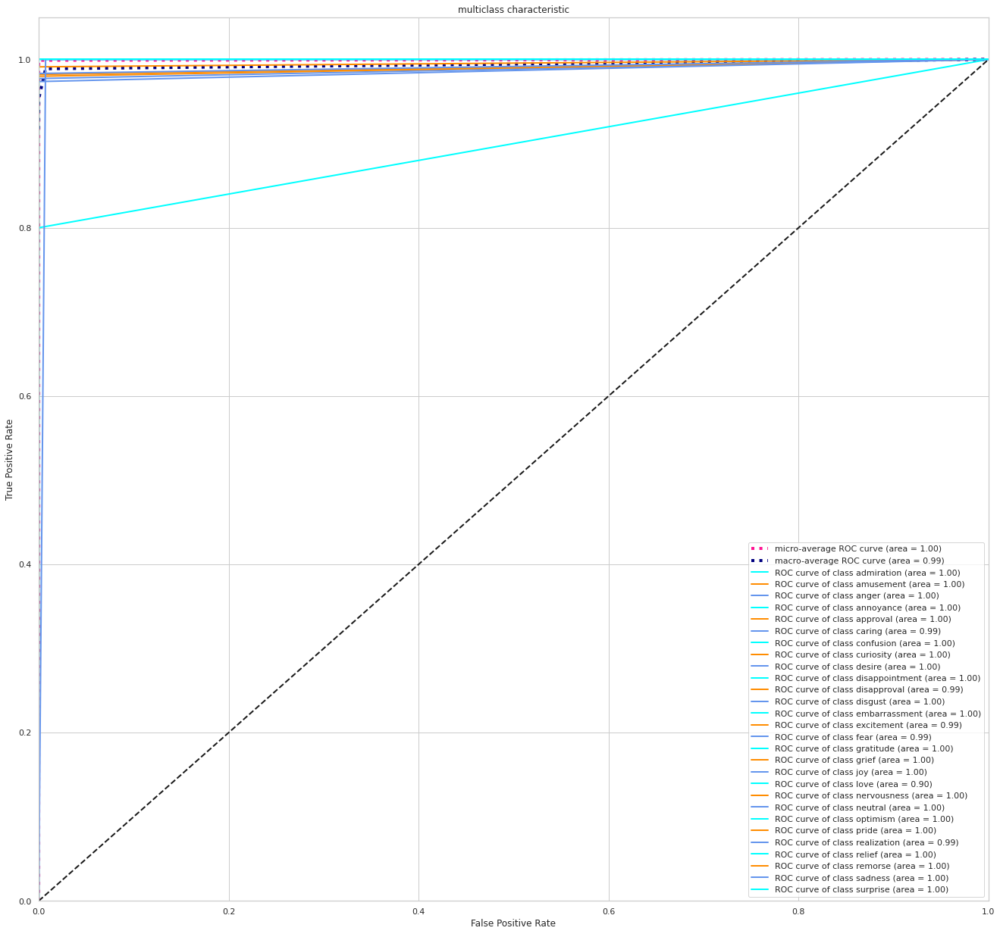

Accuracy:  0.9990078662036709
Precision::  0.9990078662036709
Recall::  0.9990078662036709
F1_Score::  0.9990078662036709

Macro precision_recall_fscore_support (macro) average
(0.9991686759091822, 0.9888410389214777, 0.9935829580932485, None)

Macro precision_recall_fscore_support (micro) average
(0.9990078662036709, 0.9990078662036709, 0.9990078662036709, None)

Macro precision_recall_fscore_support (weighted) average
(0.9990103380660528, 0.9990078662036709, 0.9990011007189513, None)

Confusion Matrix

Classification Report
                precision    recall  f1-score   support

    admiration       1.00      1.00      1.00        79
     amusement       1.00      1.00      1.00         4
         anger       1.00      1.00      1.00        34
     annoyance       1.00      1.00      1.00        18
      approval       1.00      0.99      1.00       568
        caring       1.00      0.98      0.99        44
     confusion       1.00      1.00      1.00        11
     curiosity     

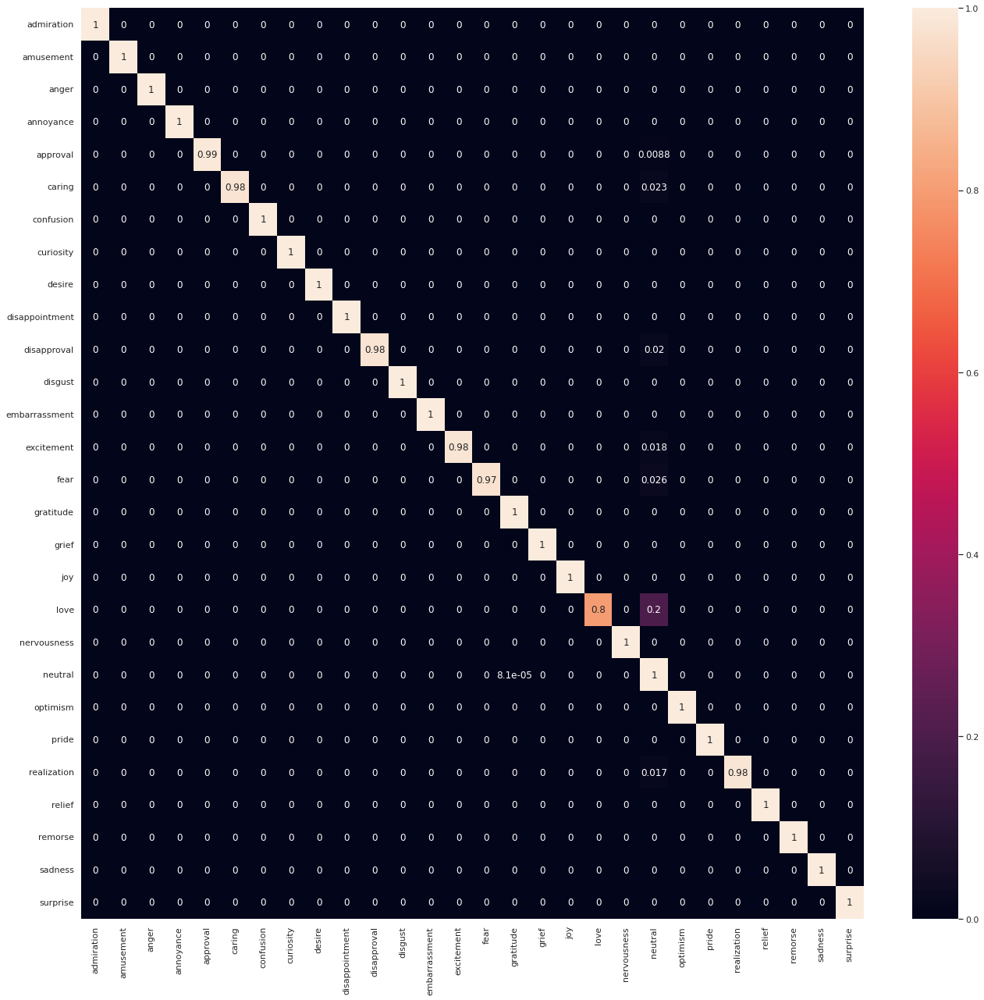

In [128]:
y_hat = grid.best_estimator_.predict(X_train_tfidf)
y_train_ohe = one_hot_encode(y_train, num_classes)
y_hat_ohe = one_hot_encode(y_hat, num_classes)
ROC_plot(y_train_ohe, y_hat_ohe, label_encoder, num_classes)
print_score(y_hat, y_train, label_encoder)




# **Roberta Transformers**



**Model Build**


In [2]:
import collections
import tqdm
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import gc
import transformers
from transformers import AutoTokenizer , AutoModel ,AutoModelForSequenceClassification , RobertaTokenizer ,RobertaModel ,BertTokenizer
from transformers import RobertaForSequenceClassification , AdamW  ,get_linear_schedule_with_warmup , RobertaTokenizerFast
from transformers import TFAutoModelForSequenceClassification , TFAutoModel
from transformers import DistilBertForSequenceClassification , TFDistilBertForSequenceClassification , TFAutoModel
from sklearn.feature_extraction.text import CountVectorizer
import spacy
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.preprocessing import OneHotEncoder
import torch
import torch.nn as nn
from torch.utils.data import DataLoader ,Dataset
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , classification_report ,f1_score , accuracy_score ,precision_score ,recall_score
import os
import re 
import nltk
import gc
import warnings
warnings.filterwarnings('ignore')

from tensorflow import keras
from keras.layers import Dense ,Dropout , Input
from keras.models import Sequential , Model
from transformers import TFRobertaModel
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression ,Ridge ,Lasso
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier ,GradientBoostingClassifier ,ExtraTreesClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC ,LinearSVC
from sklearn.naive_bayes import MultinomialNB , GaussianNB
from sklearn.feature_extraction.text import TfidfVectorizer

In [6]:
df = pd.read_csv('../input/emo-news1/emo_dect_news.csv')

In [7]:
def clean_text(text):
    url_regex ='((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*'

    text = text.lower()
#     text = re.sub('@(\w)+',' username ',text)
#     text = re.sub('#(\w)+',' hastag ',text)
#     text = re.sub(url_regex,' url ',text)
    text = re.sub(url_regex,' ',text)

    text = re.sub('@(\w)+','  ',text)
    text = re.sub('#(\w)+','  ',text)
    text = re.sub('(\r)+',' ',text)
    text = re.sub('(\n)+',' ',text)
    
    text = re.sub('(\?)+',' ',text)
    text = re.sub('(\.)+',' ',text)
    symbol = [
        'â\x97','â\x85','â\x92','â\x92','â\x92t','Â\x93','Â\x85',
        'Â\x96','Â\x92','Â\x94','â\x93','â\x91','â\x94','â\x96','â','â·','\x80'
            ]
    for i in symbol:
        text = re.sub(i,' ',text)
    html =[
        '&amp;'
          ]
    for i in html:
        text = re.sub(i,' & ',text)
    text = re.sub('\'','',text) 
    text = re.sub('https*',' ',text) 

    
    text = re.sub('!+','  ',text)    
    
    text = re.sub(':\(',' sad ',text)
    text = re.sub('/+',' ',text)
    text = re.sub('\|+',' ',text)
    
    # Word Tokenizer
    tokenizer = nltk.tokenize.word_tokenize
    
    # Drop Stop Words
    english_stop_words = nltk.corpus.stopwords.words('english')
    text = " ".join([word for word in tokenizer(text) if word not in english_stop_words ])
    
    text = re.sub('\s+',' ',text)
    return text 

In [8]:
df['clean_text'] = df['News_Title'].apply(clean_text)
df['length']     = df.clean_text.apply(lambda x:len(x.split()))
print(df.clean_text.apply(lambda x:len(x.split())).min())
print(df.clean_text.apply(lambda x:len(x.split())).max())


1
25


In [9]:
def get_n_grams(text,low_n,high_n,top_number):
    '''
    Function to Make a tuple of words and the count of each word repeated 
    in the List
    
    input ->  list of text or pandas series, n_gram_range (low ,high) , 
              number of top word 
    
    '''
    # create vocabulary
    vec = CountVectorizer(ngram_range=(low_n,high_n)).fit(text)
    B_O_G = vec.transform(text)
    
    # Get words Count
    words_count = B_O_G.sum(axis=0)
    
    # create list of words counts
    word_counts_list = np.array(words_count)[0].tolist()
    
    # create tuple of word and words count
    data = [ (word ,word_counts_list[idx]) for word,idx in vec.vocabulary_.items() ]
    
    # sort words by count descending
    sorted_data = sorted(data,key=lambda x:x[1] ,reverse=True)
    sorted_data = sorted_data[:top_number]
    new_s = []
    for d , n in sorted_data:
        new_s.append([d ,n])
    
    del vec , data ,B_O_G ,words_count,word_counts_list ,sorted_data
    plt.figure(figsize=(10,5))
    sns.barplot(data = pd.DataFrame(new_s,columns=['word','count']),x='word',y='count')
    plt.xticks(rotation=90)
    plt.show()
    
    return pd.DataFrame(new_s,columns=['word','count'])

In [10]:
encoder ={'neutral':0, 'excitement':1, 'disapproval':2, 'fear':3, 'approval':4,
       'sadness':5, 'surprise':6, 'realization':7, 'gratitude':8, 'relief':9,
       'nervousness':10, 'admiration':11, 'optimism':12, 'grief':13, 'disgust':14,
       'disappointment':15, 'caring':16, 'joy':17, 'desire':18, 'curiosity':19, 'anger':20,
       'confusion':21, 'amusement':22, 'annoyance':23, 'love':24, 'pride':25, 'remorse':26,
       'embarrassment':27}

df.Emotion = df.Emotion.map(encoder)

print('min sentences length : ',df.length.min())
print('max sentences length : ',df.length.max())

min sentences length :  1
max sentences length :  25


In [11]:
class MY_DATA_SET(Dataset):
    
    def __init__(self, texts, max_len, targets=None):
        '''Initiate the arguments of the object.
        texts: the raw excerpt or preprocessed text from df
        targets: corresponding targets
        tokenizer: the tokenizer from transformers library
        max_len: the size of the tokenizer
        is_test: wether the data is a test/validation or train
        metadata: additional dataframe with features to use for the model'''
        
        self.text = texts
        self.targets = targets
        self.tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
        self.max_len = max_len
        
    def __len__(self):
        '''Returns the size of the dataset.'''
        return len(self.text)
    
    def __getitem__(self, i):
        '''This will help during the data_loader operation.
        i: index(es) to select the data'''
        
        # Select the text & tokenize 
        inputs = self.tokenizer(str(self.text[i]),
                                max_length = self.max_len,
                                padding = "max_length",
                                truncation = True
                                ,return_tensors='pt'
                               )
        
        ids = inputs["input_ids"].flatten()
        mask = inputs["attention_mask"].flatten()
        

        return {"input_ids" : ids,
                    "attention_mask" : mask,
                    "target" : torch.tensor(self.targets[i], dtype=torch.long)}


**Model Evalution**



Make Data Input & Attention Mask


In [12]:
# Split Data
train ,test = train_test_split(df,test_size=.3,random_state=42)

train_x   = train.clean_text.values
train_y = train.Emotion.values
test_x   = test.clean_text.values
test_y = test.Emotion.values

# MODEL NAME  
MODEL_NAME    = 'roberta-base'

# Instantiate Train Dataset object
dataset = MY_DATA_SET(texts=train_x, targets=train_y, max_len=128 )

# The Train Dataloader
train_dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

# Instantiate  Test Dataset object
dataset = MY_DATA_SET(texts=test_x, targets=test_y, max_len=128 )
# The Test Dataloader
test_dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

In [13]:
class MY_MODEL(torch.nn.Module):
    def __init__(self,output):
        super(MY_MODEL,self).__init__()
        self.model   =  RobertaModel.from_pretrained('roberta-base')
        self.drop = nn.Dropout(0.3)
        self.out  = nn.Linear(self.model.config.hidden_size,output)
        
    def forward(self,input_ids,attention_mask): 
        _ , pool_out = self.model(
                        input_ids =input_ids,
                        attention_mask=attention_mask,
                        return_dict=False,
                )
        output = self.drop(pool_out)
        return self.out(output)

In [14]:
def train(model,data_loader,loss,optimizer ,device,n_examples):
    
    model  = model.train()
    
    losses = []
    
    correct_predictions = 0
    
    for d in tqdm.tqdm(data_loader,total=len(data_loader)):
        input_ids    = d['input_ids'].to(device)
        attention_mask = d['attention_mask'].to(device)
        label     = d['target'].to(device)
        output    = model(input_ids = input_ids,attention_mask = attention_mask)
        _ , prediction = torch.max(output,dim=1)
        
        loss_fn = loss(output, label)
        
        correct_predictions += torch.sum(prediction == label)
        losses.append(loss_fn.item())

        loss_fn.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()
        
    return correct_predictions.double() / n_examples, np.mean(losses)

In [15]:
def eval_model(model, data_loader, loss_fn, device, n_examples):
    model = model.eval()

    losses = []
    correct_predictions = 0

    with torch.no_grad():
        for d in tqdm.tqdm(data_loader,total=len(data_loader)):
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            targets = d["target"].to(device)

            outputs = model( input_ids = input_ids, attention_mask = attention_mask)
            _, preds = torch.max(outputs, dim=1)

            loss = loss_fn(outputs, targets)

            correct_predictions += torch.sum(preds == targets)
            losses.append(loss.item())
    
    return correct_predictions.double() / n_examples, np.mean(losses)

In [16]:
gc.collect()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MY_MODEL(len(df.Emotion.unique())).to(device)

# Optimizer
optimizer = AdamW( 
                   model.parameters(),
                   lr=0.001,
                   correct_bias=False
                 )

# Loss Function
loss = nn.CrossEntropyLoss().to(device)

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.weight', 'lm_head.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [17]:
gc.collect()
best_accuracy = 0

EPOCHS = 1

total_steps = len(train_dataloader) * EPOCHS

scheduler   = get_linear_schedule_with_warmup(
  optimizer,
  num_warmup_steps=0,
  num_training_steps=total_steps
)



## LOAD MODEL If Save PRE TRAINED
# MODEL_PATH = ''
# model = MY_MODEL(3).to(device)
# model.load_state_dict(torch.load(MODEL_PATH))

for epoch in range(EPOCHS):

    print(f'Epoch {epoch + 1}/{EPOCHS}')
    print('-' * 10)

    train_acc, train_loss =train( 
        model,
        train_dataloader,
        loss,
        optimizer,
        device,
        len(train_y)
    )


    print(f'Epoch : {epoch+1} -- Train loss {train_loss} accuracy {train_acc}')

    val_acc, val_loss = eval_model(
    model,
    test_dataloader,
    loss, 
    device,
    len(test_y)
    )

    print(f'Epoch : {epoch+1} -- Val   loss {val_loss} accuracy {val_acc}')
    print()

    if val_acc > best_accuracy:
        torch.save(model.state_dict(), 'best_model_state.bin')
        best_accuracy = val_acc
        print('finish loading model')
        print('---------------------')
        print()

Epoch 1/1
----------


100%|██████████| 686/686 [1:55:48<00:00, 10.13s/it]


Epoch : 1 -- Train loss 0.8922283092232655 accuracy 0.8645102505694761


100%|██████████| 294/294 [15:08<00:00,  3.09s/it]


Epoch : 1 -- Val   loss 0.7276552988051557 accuracy 0.8707482993197279

finish loading model
---------------------



In [18]:
# Split Data 
train , test = train_test_split(df,test_size=.3,random_state=42)

In [19]:
def create_data(News_Title,Emotion,tokenizer,max_length):
    # Empty Arrays
    input_ids = []
    attention_mask = []
    
    # Loop Through List and Create input ids & attention mask
    for i in tqdm.tqdm(News_Title,total=len(News_Title)):
        x = tokenizer.encode_plus(str(i),
                              return_attention_mask=True,
                              padding='max_length',
                              truncation=True,
                              max_length=max_length,
                              add_special_tokens=True,
                              )
        input_ids.append(x['input_ids'])
        attention_mask.append(x['attention_mask'])
    # One Hot Encode Labels
    one = OneHotEncoder()
    Emotion = one.fit_transform(Emotion.reshape(-1,1)) 
    Emotion = Emotion.toarray()
    del one , tokenizer , x 
    print('Data Shapes : ')
    print(np.array(input_ids).shape,np.array(attention_mask).shape,Emotion.shape )
    return  np.array(input_ids) , np.array(attention_mask) , Emotion

In [20]:
max_length = 80
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
    
print('Start Create Train Data')
# Create Train Data
train_ids , train_attention_mask ,train_labels = create_data(train.clean_text.values,
                                                             train.Emotion.values ,
                                                             tokenizer
                                                             ,max_length)

print('Start Create Test Data')
# Create Test Data
test_ids , test_attention_mask ,test_labels = create_data(test.clean_text.values,
                                                          test.Emotion.values,
                                                          tokenizer ,
                                                          max_length)

Start Create Train Data


100%|██████████| 10975/10975 [00:03<00:00, 2830.44it/s]


Data Shapes : 
(10975, 80) (10975, 80) (10975, 28)
Start Create Test Data


100%|██████████| 4704/4704 [00:01<00:00, 3259.91it/s]


Data Shapes : 
(4704, 80) (4704, 80) (4704, 27)


In [21]:
# Model Input 
inpu = Input(shape=(max_length,),dtype='int32')
atten = Input(shape=(max_length,),dtype='int32')

# Roberta Model
roberta_model = TFRobertaModel.from_pretrained('roberta-base')
output = roberta_model([inpu,atten])
output = output[1]

# Dropout Layer with 60%
output = Dropout(0.1)(output)
output = Dense(8,activation='relu')(output)
# Output Layer With 3 Classes
output = Dense(len(df.Emotion.unique()),activation='softmax')(output)

# Model Instance & Model Compile 
model = Model(inputs=[inpu,atten],outputs=output)
model.compile(optimizer='adam',loss='CategoricalCrossentropy',metrics=['accuracy'])

Downloading:   0%|          | 0.00/627M [00:00<?, ?B/s]

Some layers from the model checkpoint at roberta-base were not used when initializing TFRobertaModel: ['lm_head']
- This IS expected if you are initializing TFRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFRobertaModel were initialized from the model checkpoint at roberta-base.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


In [22]:
# Model Checkpoint
checkpoint_filepath = './'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
        
)

# NO.  Epochs
EPOCHS = 1

# Use GPU
tf.debugging.set_log_device_placement(True)

# Train Model
model.fit([train_ids,train_attention_mask]
          ,train_labels,
          validation_split=.3,
          epochs=EPOCHS,
          verbose=1,
          callbacks=[model_checkpoint_callback]
          )

2022-07-27 11:21:54.952298: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


241/241 [==============================] - 3937s 16s/step - loss: 0.9231 - accuracy: 0.8700 - val_loss: 0.8376 - val_accuracy: 0.8706


In [23]:
# Test Model
y_h = model.predict([test_ids,test_attention_mask])
y_h = np.argmax(y_h, axis=1)
test_labels = np.argmax(test_labels, axis=1)
print('accuracy score: {:.4f}'.format(accuracy_score(test_labels,y_h)))

accuracy score: 0.8707



# **DistilBERT**



Finetunning


In [27]:
max_length = 80
MODEL_NAME = 'distilbert-base-uncased-finetuned-sst-2-english'
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
print('Start Create Train Data')
# Create Train Data
train_ids , train_attention_mask ,train_labels = create_data(train.clean_text.values,
                                                             train.Emotion.values,
                                                             tokenizer ,
                                                             max_length)

print('Start Create Test Data')
# Create Test Data
test_ids , test_attention_mask ,test_labels = create_data(test.clean_text.values,
                                                          test.Emotion.values ,
                                                          tokenizer,
                                                          max_length)

Downloading:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Start Create Train Data


100%|██████████| 10975/10975 [00:01<00:00, 6920.53it/s]


Data Shapes : 
(10975, 80) (10975, 80) (10975, 28)
Start Create Test Data


100%|██████████| 4704/4704 [00:00<00:00, 7069.45it/s]


Data Shapes : 
(4704, 80) (4704, 80) (4704, 27)


In [28]:
MAX_LENGTH = 80

def custom():
    x=Input(shape=(MAX_LENGTH,),dtype='int64')
    y=Input(shape=(MAX_LENGTH,),dtype='int64')
    model = TFAutoModel.from_pretrained(MODEL_NAME)
    out= model([x,y])
    out = keras.layers.Flatten()(out.last_hidden_state)
    out=Dense(3,activation='softmax')(out)
    mod = Model(inputs=[x,y],outputs=out)
    return mod

custom_model=custom()
custom_model.compile(optimizer='adam',loss='CategoricalCrossentropy',metrics=['accuracy'])

Downloading:   0%|          | 0.00/256M [00:00<?, ?B/s]

2022-07-27 14:25:06.480407: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
Some layers from the model checkpoint at distilbert-base-uncased-finetuned-sst-2-english were not used when initializing TFDistilBertModel: ['dropout_19', 'classifier', 'pre_classifier']
- This IS expected if you are initializing TFDistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFDistilBertModel were initialized from the model checkpoint at distilbert-base-uncased-finetuned-sst-2-english.
If your task is similar to the tas

In [29]:
for layer in custom_model.layers[:3]:
    layer.terinable =False



In [24]:
# Model Checkpoint
checkpoint_filepath = './'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
        
)

# NO.  Epochs
EPOCHS = 1

# Use GPU
tf.debugging.set_log_device_placement(True)

# Train Model
model.fit([train_ids,train_attention_mask]
          ,train_labels,
          validation_split=.3,
          epochs=EPOCHS,
          verbose=1,
          callbacks=[model_checkpoint_callback]
          )

241/241 [==============================] - 3934s 16s/step - loss: 0.7338 - accuracy: 0.8744 - val_loss: 0.7268 - val_accuracy: 0.8706


In [ ]:
# Test Model
y_h = model.predict([test_ids,test_attention_mask])
y_h = np.argmax(y_h, axis=1)
test_labels = np.argmax(test_labels, axis=1)
print('accuracy score: {:.4f}'.format(accuracy_score(test_labels,y_h)))

